In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import networkx as nx


from sklearn.preprocessing import OneHotEncoder
from sklearn.impute import KNNImputer


In [2]:
sns.set_style("ticks")

In [3]:
# Load data

train = pd.read_csv('./data/train.csv')
greeks = pd.read_csv('./data/greeks.csv')
test = pd.read_csv('./data/test.csv')

In [4]:
# Set index

train = train.set_index('Id')
test = test.set_index('Id')
greeks = greeks.set_index('Id')

# Separate target and features
X = train.drop('Class', axis = 1)
y = train['Class']

<h3><center> Data Organization / Cleaning </center></h3>

In [5]:
# Get features list
violin_features = list(X.columns)
categorial_features = X.columns[X.dtypes != float].values.tolist()

# Remove non-float features
violin_features.remove(*categorial_features)

print(categorial_features)

['EJ']


One-hot encoding for 'EJ' categorial feature

In [6]:
# Encode categorial object 'EJ' feature 

enc = OneHotEncoder()
enc.fit(X['EJ'].values.reshape(-1, 1))
onehot_cols = ['EJ' + '_' + x for x in enc.categories_[0]]

X[onehot_cols] = enc.transform(X['EJ'].values.reshape(-1, 1)).toarray()
X = X.drop('EJ', axis = 1)

#test[onehot_cols] = enc.transform(test['EJ'].values.reshape(-1, 1)).toarray()
#test = test.drop('EJ', axis = 1)

#violin_features.extend(onehot_cols)

Check and fill missing values using KNN Imputer

In [7]:
# Check which features are missing and how many missing data points are there

nas = X.isnull().sum()[X.isnull().sum() > 0]
nas

BQ    60
CB     2
CC     3
DU     1
EL    60
FC     1
FL     1
FS     2
GL     1
dtype: int64

In [8]:
# Since the features which contain missing values are not normally-distributed, we will use iterative imputer. 

imp = KNNImputer() # weight by distance but use many neighbors
X2 = pd.DataFrame(imp.fit_transform(X), index = X.index, columns = X.columns)

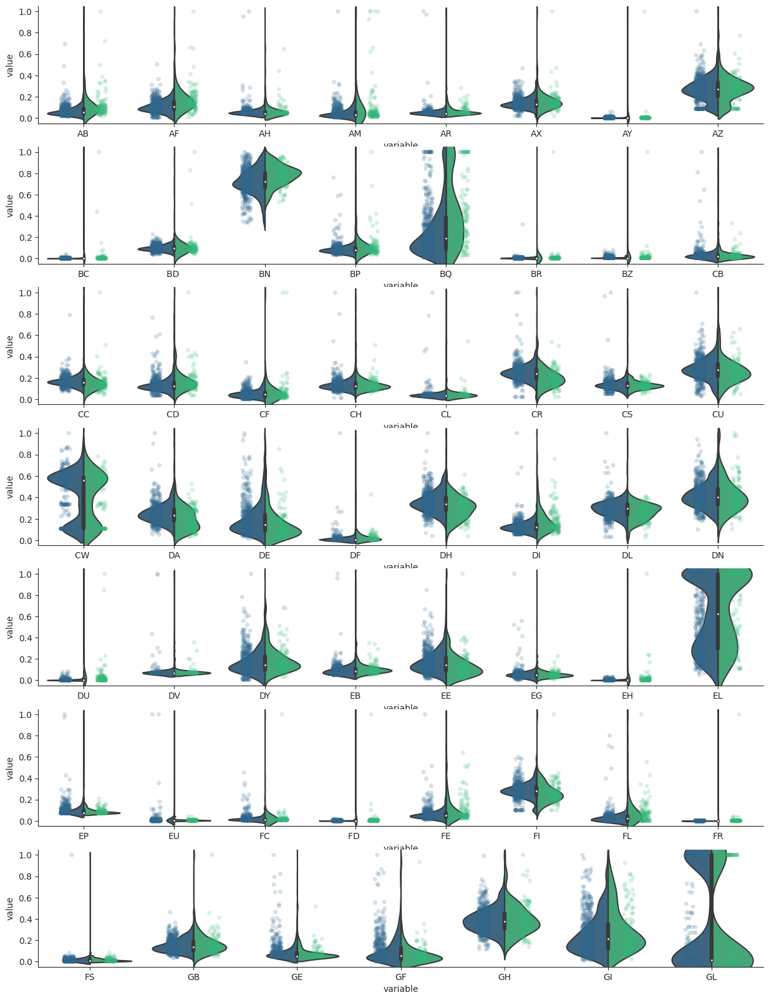

In [9]:
# Plot violin plots of non-categorial features

fig, axs = plt.subplots(nrows = 7, ncols = 1, figsize = (15, 20))

axs = np.ravel(axs)

for row in range(7):
    features = violin_features[row*8:(row+1)*8]
    #df_plot = pd.concat([X2[features], y], axis = 1)
    df_plot = pd.concat([X2[features], y], axis = 1)
    df_plot = df_plot / df_plot.max(axis = 0) # Normalize them for plotting purposes
    df_plot = df_plot.melt(id_vars = ['Class'], value_vars = features)
    sns.violinplot(data = df_plot, x = 'variable', y = 'value', hue = 'Class', split = True,palette = 'viridis', ax = axs[row])
    sns.stripplot(data = df_plot, x = 'variable', y = 'value', hue = 'Class', dodge = True,palette = 'viridis', alpha = 0.2, ax = axs[row])
    axs[row].get_legend().remove()
sns.despine()
#plt.tight_layout()

Semi-insights:
*Highly concentrated AY, BC, BR, BZ, DU, EH, EU, FR  <br>
* Large AM -> Highly likely Green <br>
* Large CR -> Slightly likely blue <br>
* Large DH -> Slightly likely blue <br>
* Large DA -> Slightly likely blue <br>
* Large EE -> Slightly likely blue <br>
* Large FI -> Slightly likely blue <br>
<br>

Before studying the correlations, let us complete the missing values.

In [10]:
# Plot categorial

In [11]:
df_corr = X2.corr().abs()
corr_pairs = df_corr.unstack().dropna().sort_values(ascending=False)
selected_corr_pairs = corr_pairs[(corr_pairs < 1) & (corr_pairs > 0.75)]
selected_corr_pairs = selected_corr_pairs.iloc[::2] # drop the identical 
selected_corr_pairs

EJ_B  EJ_A    1.000000
EJ_A  GL      0.978148
EJ_B  GL      0.978148
EH    FD      0.971152
DV    CL      0.948991
BZ    BC      0.907981
DU    EH      0.850953
AR    DV      0.823012
DU    FD      0.805990
EP    CS      0.794158
      AR      0.754615
BC    BD      0.753051
dtype: float64

Spaces?

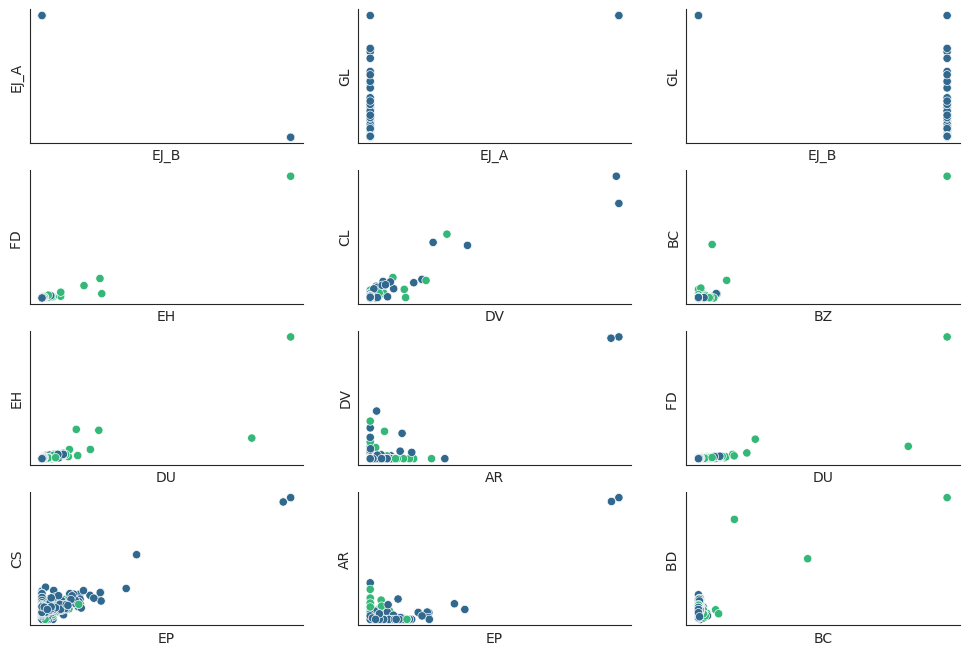

In [12]:
# Plot calibration plots of highly correlated categorial features

fig, axs = plt.subplots(nrows = 4, ncols = 3, figsize = (12, 8))

axs = np.ravel(axs)

for i, pair in enumerate(selected_corr_pairs.index):
    f1, f2 = pair
    sns.scatterplot(data = pd.concat([X2[[f1, f2]], y], axis = 1), x = f1, y = f2, hue = 'Class', ax = axs[i], palette='viridis')
    #sns.regplot(data = train[[f1, f2, 'Class']], x = f1, y = f2, ax = axs[i])

    axs[i].get_legend().remove()
    axs[i].set_xticks([])
    axs[i].set_yticks([])
sns.despine()


In [13]:
df_categorial = train[['GL', 'EJ', 'Class']]


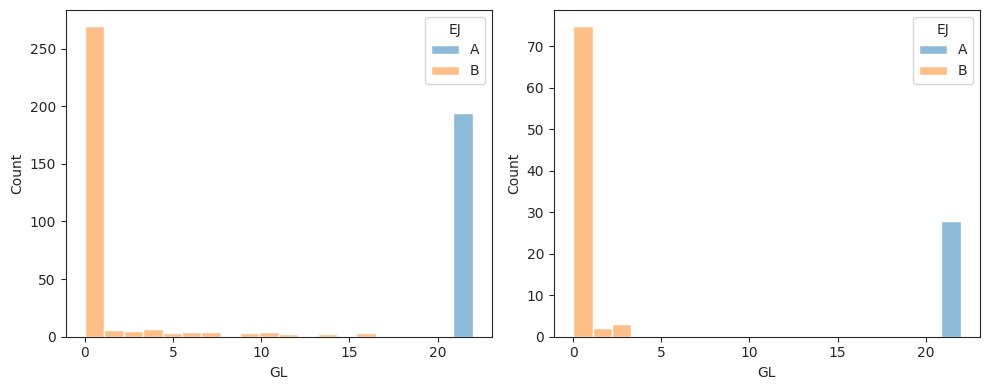

In [14]:
fig, ax = plt.subplots(ncols = 2, nrows = 1, figsize = (10, 4))
sns.histplot(data = train[train['Class'] == 0], x = 'GL', hue = 'EJ', ax = ax[0], hue_order = ['A', 'B'], bins = 20)
sns.histplot(data = train[train['Class'] == 1], x = 'GL', hue = 'EJ', ax = ax[1], hue_order = ['A', 'B'], bins = 20)
plt.tight_layout()

In [15]:
print('Value count with GL over 18\n',train.loc[train['GL'] >= 18, "EJ"].value_counts())
print('Value count with GL under 18\n',train.loc[train['GL'] < 18, "EJ"].value_counts())

Value count with GL over 18
 EJ
A    222
B      1
Name: count, dtype: int64
Value count with GL under 18
 EJ
B    393
Name: count, dtype: int64


In [16]:
print('The single value with B ('+train.loc[(train['GL'] > 18) & (train['EJ'] == 'B')].index[0]+') is not the same as the missing value in GL ('+X['GL'][X['GL'].isnull()].index[0]+')')

The single value with B (38325b0c36e5) is not the same as the missing value in GL (f46e39a96ee9)


Thus, smaller GL will be always in Class B, and larger A will always be in class A. 
<br>
Let us map the correlated features in a network.

In [17]:
selected_corr_pairs = corr_pairs[(corr_pairs < 1) & (corr_pairs > 0.6)]
selected_corr_pairs = selected_corr_pairs.iloc[::2] # drop the identical 
selected_corr_pairs
G = nx.DiGraph(selected_corr_pairs.index.to_list())

In [18]:
def generate_points_on_circle(nodes, radius=1):
    points = {}
    num_points = len(nodes)
    for i in range(num_points):
        angle = 2 * np.pi * i / num_points
        x = radius * np.cos(angle)
        y = radius * np.sin(angle)
        points[nodes[i]] = (x, y)
    return points

# Generate 15 points on the circle with radius 1
points_on_circle = generate_points_on_circle(list(list(G.nodes())))


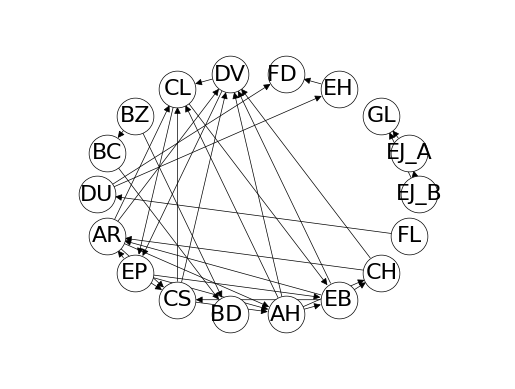

In [19]:
params = {
    "font_size": 16,
    "node_size": 700,
    "node_color": "white",
    "edgecolors": "black",
    "linewidths": 0.5,
    "width": 0.5,
}
nx.draw_networkx(G, points_on_circle, **params)
ax = plt.gca()
ax.margins(0.2)
plt.axis("off")
plt.show()

In [20]:
# Add clusters

<h3><center> Dimensionality Reduction </center></h3>

In [21]:
from sklearn.decomposition import PCA

Let us try PCA.


In [22]:
pca = PCA(n_components=3)
X2_reduced = pd.DataFrame(pca.fit_transform(X2 / X2.max()), index = X2.index) # PCA on scaled data
X2_reduced = X2_reduced / X2_reduced.max()
print('The 3 PCA components explain {:.2f}%, {:.2f}% ,and {:.2f}%, respectievly.'.format(*100*pca.explained_variance_ratio_))


The 3 PCA components explain 54.40%, 8.40% ,and 5.68%, respectievly.


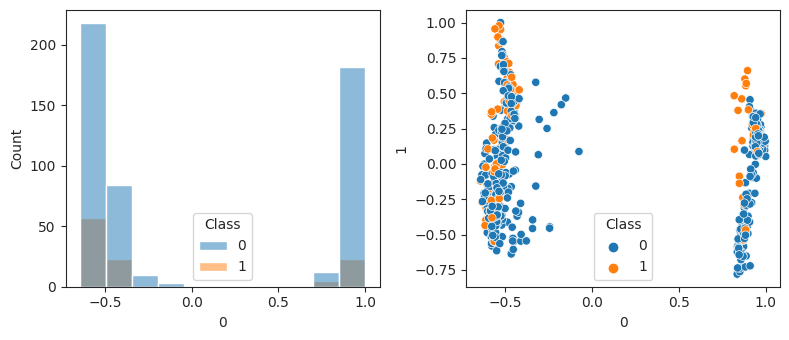

In [23]:
fig, axs = plt.subplots(ncols = 2, nrows = 1, figsize = (8, 3.5))

sns.histplot(data = pd.concat([X2_reduced, y], axis = 1), x = 0, hue = 'Class', ax = axs[0])
sns.scatterplot(data = pd.concat([X2_reduced, y], axis = 1), x = 0, y = 1, hue = 'Class', ax = axs[1])
plt.tight_layout()

Text(0.5, 0, '2')

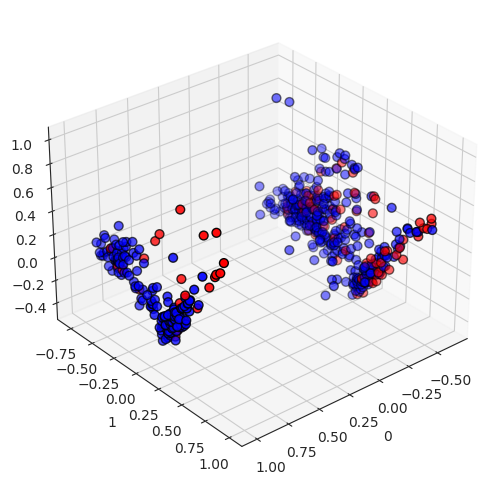

In [24]:
fig = plt.figure(1, figsize=(8, 6))
ax = fig.add_subplot(projection="3d", elev=30, azim=50)
ax.scatter(
    X2_reduced[0],
    X2_reduced[1],
    X2_reduced[2],
    c=y,
    cmap='bwr',
    edgecolor="k",
    s=40,
)
ax.set_xlabel('0')
ax.set_ylabel('1')
ax.set_zlabel('2')

* The first component can clearly cluster the data to two clusters. 
* The distribution is not related to the class itslef.
* The second component does not help to further cluster the data. The third is even less useful.<br>

These observations are in line with the relatively high explained variance ratio of the first component compared to the second one. <br>
Let us examine the components.

In [25]:
pca_importance = pd.DataFrame(pca.components_[0,:], index = X2.columns, columns = ['Importance']).abs().sort_values(ascending=False, by = "Importance").reset_index()
pca_importance = pca_importance.rename({'index':'Features'}, axis = 1)

In [26]:
pca_importance['Importance cumsum'] = pca_importance['Importance'].cumsum()

<Axes: xlabel='Features', ylabel='Importance cumsum'>

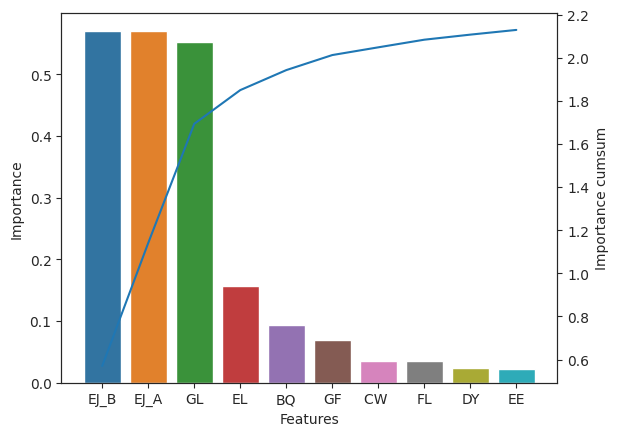

In [27]:
ax = sns.barplot(data = pca_importance[0:10], y = 'Importance', x = 'Features')
ax2 = ax.twinx()
sns.lineplot(data = pca_importance[0:10], y = 'Importance cumsum', x = 'Features', ax = ax2)

<h3><center> Baseline Models </center></h3>

In [28]:
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
import lightgbm as lgb
import xgboost as xgb
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.utils.class_weight import compute_sample_weight, compute_class_weight
from sklearn.metrics import f1_score, accuracy_score


In [29]:
def balanced_logloss(y, p):
    '''
    Calculation of balance logloss according to the competition metric.
    Input:
        y   -   Real target
        p   -   Predicted probabilities
    Output:
        L   -   Balanced logloss
    '''
    # Clip the propabilities to avoid function extremes
    p = np.clip(p, 1e-15, 1-1e-15) 

    # Count targets
    N_0 = y[y == 0].shape[0] 
    N_1 = y[y == 1].shape[0]
    
    # Arrays of ones for samples which belong to each target 0 
    y0 = np.zeros_like(y) 
    y0[y == 0] = 1
    y1 = np.zeros_like(y) 
    y1[y == 1] = 1

    # Probability array for each target
    p0 = p[:,0] 
    p1 = p[:,1] 

    # logloss of target, normalized to the number of samples for each target
    logloss_0 = -np.sum(y0*np.log(p0))/(N_0+1e-15) 
    logloss_1 = -np.sum(y1*np.log(p1))/(N_1+1e-15) 

    L = (logloss_0 + logloss_1)/2

    return L
    
# test
# y_tmp = np.array([0, 0, 0, 0, 0])
# p_tmp = np.array([[0.91, 0.09], # 0
#                  [0.89, 0.11], # 0
#                  [0.07, 0.93], # 1
#                  [0.02, 0.98], # 1
#                  [0.84, 0.16]]) # 0
# balanced_logloss(y_tmp, p_tmp)

In [30]:
def preprocess(X_train, X_test, y_train): # 
    '''
    A function which imputes (knn), scales (standard scaler), and calculate class weights.
    Input: 
        X_train   -   Training X dataset (df).
        X_test    -   Testing X dataset (df).
        y_train   -   Training target (df) for weighting purposes. 
    Output:
        X_train   -   Scaled and imputed training X dataset (df).
        X_test    -   Scaled and imputed testing X dataset (df).
        sw        -   Samples weight based on the training target. 
    '''
    # Add missing values using KNN Imputer
    imp = KNNImputer(weights = 'distance', n_neighbors=20).fit(X_train)

    X_train = pd.DataFrame(imp.transform(X_train), index = X_train.index, columns = X_train.columns)
    X_test = pd.DataFrame(imp.transform(X_test), index = X_test.index, columns = X_test.columns)

    # Scale data using Standard Scaler
    scaler = StandardScaler().fit(X_train)

    X_train = pd.DataFrame(scaler.transform(X_train), index = X_train.index, columns = X_train.columns)
    X_test = pd.DataFrame(scaler.transform(X_test), index = X_test.index, columns = X_test.columns)

    # Class and sample weights
    cw = compute_class_weight(class_weight = "balanced", classes = np.unique(y_train), y = y_train)
    cw = dict(zip(np.unique(y_train), cw))
    sw = compute_sample_weight(cw, y_train)

    return X_train, X_test, imp, scaler, sw, cw

In [31]:
def pred_score_store(i, X_train, y_train, X_test, y_test, models, models_names):
    '''
    A function which predicts, scores predictions, and calculate scores for the different models.
    The function treats a single split.
    Inputs:
        i              -   Split number (int)
        X_train        -   Training X dataset (df).
        X_test         -   Testing X dataset (df).
        y_train        -   Training target (df). 
        y_test         -   Testing target (df). 
        models         -   Trained models to be evaluated (string)
        models_names   -   Trained models to be evaluated
    Outputs:
        score          -   Scores 
        y_hats         -   Predictions
        ps             -   Predicted probabilities
    '''
    score, y_hats, ps = {}, {}, {}

    # Iterate over models, store their predictions, probabilities and scores
    for model, model_name in zip(models, models_names):
        model_train_name = (model_name, 'train', str(i)) 
        model_test_name = (model_name, 'test', str(i))

        # Store predicted probabilities
        ps[model_train_name] = model.predict_proba(X_train) 
        ps[model_test_name] = model.predict_proba(X_test)

        # Store predicted targets
        y_hats[model_train_name] = model.predict(X_train) 
        y_hats[model_test_name] =  model.predict(X_test)

        # Calculate scores
        score[(model_name,str(i))] = [balanced_logloss(y_test, ps[model_test_name]),  
                                      balanced_logloss(y_train, ps[model_train_name]),
                                      f1_score(y_test, y_hats[model_test_name]), 
                                      f1_score(y_train, y_hats[model_train_name]),
                                      accuracy_score(y_test, y_hats[model_test_name]), 
                                      accuracy_score(y_train, y_hats[model_train_name])] 

    
    return score, y_hats, ps

In [32]:
def split_train(X_in, y_in, random_state):
    
    
    skf = StratifiedKFold(n_splits=5, random_state=random_state, shuffle=True)

    scores = {}

    for i, (train_index, test_index) in enumerate(skf.split(X_in, y_in)):  
        # Split
        X_train, X_test = X_in.iloc[train_index, :], X.iloc[test_index, :]
        y_train, y_test = y_in.iloc[train_index], y.iloc[test_index]

        X_train, X_test, imp, scaler, sw, cw = preprocess(X_train, X_test, y_train)

        # RF
        rf = RandomForestClassifier(criterion = 'log_loss')
        rf.fit(X_train, y_train, sample_weight=sw)

        # GB
        gb = GradientBoostingClassifier(loss = 'log_loss')
        gb.fit(X_train, y_train, sample_weight=sw)

        # xgboost
        xgb_clf = xgb.XGBClassifier(n_jobs = 28)
        xgb_clf.fit(X_train, y_train, sample_weight=sw)

        # Predict, score and store
        score_split, y_hats, ps = pred_score_store(i, X_train, y_train, X_test, y_test, [rf, gb, xgb_clf], ['rf', 'gb', 'xgb'])
        scores = {**scores, **score_split}

    scores_cols= ['balanced_logloss','balanced_logloss_train',
                  'f1_score','f1_score_train',
                  'accuracy_score','accuracy_score_train']
    df_scores = pd.DataFrame(scores, index = scores_cols).T.sort_index()
    
    return(df_scores, y_hats, ps)

In [33]:
scores = []
for split in [42]:#[0, 1, 2, 7, 13, 25, 42, 67, 73]:
    score, y_hats, ps = split_train(X, y, split)
    scores.append(score)

In [34]:
df_scores = pd.concat(scores).reset_index().groupby('level_0').describe().loc[:,(slice(None),['count','mean','std'])]
df_scores

balanced_logloss                     balanced_logloss_train            \
                   count      mean       std                  count      mean   
level_0                                                                         
gb                   5.0  0.362447  0.152423                    5.0  0.017992   
rf                   5.0  0.479943  0.045521                    5.0  0.128589   
xgb                  5.0  0.410585  0.189195                    5.0  0.006160   

                  f1_score                     f1_score_train            \
              std    count      mean       std          count mean  std   
level_0                                                                   
gb       0.001240      5.0  0.723428  0.079285            5.0  1.0  0.0   
rf       0.004487      5.0  0.567414  0.084102            5.0  1.0  0.0   
xgb      0.000121      5.0  0.775551  0.079358            5.0  1.0  0.0   

        accuracy_score                     accuracy_score_train            
                 count      mean       std                count mean  std  
level_0                                                                    
gb                 5.0  0.904340  0.024132                  5.0  1.0  0.0  
rf                 5.0  0.888172  0.015582                  5.0  1.0  0.0  
xgb                5.0  0.923761  0.028079                  5.0  1.0  0.0

<h3><center> Models Optimization using Optuna  </center></h3>

In [35]:
import optuna
#from sklearn.metrics import make_scorer
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.metrics import confusion_matrix

In [36]:
def optuna_balanced_logloss(clf, X, y):
    '''
    Calculation of balance logloss according to the competition metric.
    Input:
        y   -   Real target
        p   -   Predicted probabilities
    Output:
        L   -   Balanced logloss
    '''
    # Calculate p
    p = clf.predict_proba(X)

    # Clip the propabilities to avoid function extremes
    p = np.clip(p, 1e-15, 1-1e-15) 

    # Count targets
    N_0 = y[y == 0].shape[0] 
    N_1 = y[y == 1].shape[0]
    
    # Arrays of ones for samples which belong to each target 0 
    y0 = np.zeros_like(y) 
    y0[y == 0] = 1
    y1 = np.zeros_like(y) 
    y1[y == 1] = 1

    # Probability array for each target
    p0 = p[:,0] 
    p1 = p[:,1] 

    # logloss of target, normalized to the number of samples for each target
    logloss_0 = -np.sum(y0*np.log(p0))/(N_0+1e-15) 
    logloss_1 = -np.sum(y1*np.log(p1))/(N_1+1e-15) 

    L = (logloss_0 + logloss_1)/2

    return L
    
# test
# y_tmp = np.array([0, 0, 0, 0, 0])
# p_tmp = np.array([[0.91, 0.09], # 0
#                  [0.89, 0.11], # 0
#                  [0.07, 0.93], # 1
#                  [0.02, 0.98], # 1
#                  [0.84, 0.16]]) # 0
# balanced_logloss(y_tmp, p_tmp)

In [39]:
def split_optimize_train(X_in, y_in, n_trials, random_state):

    skf = StratifiedKFold(n_splits=5, random_state=random_state, shuffle=True)

    rf_studies = {}
    rf_bests = {}

    xgb0_studies = {}
    xgb0_bests = {}

    xgb1_studies = {}
    xgb1_bests = {}

    gb_studies = {}
    gb_bests = {}
    for i, (train_index, val_index) in enumerate(skf.split(X_in, y_in)):
        X_train, X_val = X_in.iloc[train_index, :], X_in.iloc[val_index, :]
        y_train, y_val = y_in.iloc[train_index], y_in.iloc[val_index]

        X_train, X_val, imp, scaler, sw, cw = preprocess(X_train, X_val, y_train)
        cw = cw[0] / cw[1]
        print(random_state, i, 'rf')

        # Optimize RF
        def objective_rf(trial):
            rf_params = {
                "criterion": "log_loss",
                "random_state":random_state,
                "n_estimators":trial.suggest_int("n_estimators", 70, 130), 
                 "max_depth": trial.suggest_int("max_depth", 1, 600),
                 "min_samples_split": trial.suggest_int("min_samples_split", 2, 150),
                 "min_samples_leaf": trial.suggest_int("min_samples_leaf", 2, 60),
            }

            rf_clf = RandomForestClassifier(**rf_params)
            
            rf_clf.fit(X_train, y_train, sample_weight = sw)

            p_val = rf_clf.predict_proba(X_val)
            
            scores = balanced_logloss(y_val, p_val)

            return scores

        rf_study = optuna.create_study(direction="minimize")
        rf_study.optimize(objective_rf, n_trials=n_trials, n_jobs = -1)

        rf_best = RandomForestClassifier(**rf_study.best_params).fit(X_train, y_train, sample_weight=sw)

        train_loss = balanced_logloss(y_train, rf_best.predict_proba(X_train))

        rf_studies[(i,random_state)] = {**{"train_score": train_loss}, 
                         **{"val_score": rf_study.best_value}, 
                         **rf_study.best_params}
        rf_bests[(i,random_state)] = rf_best
        print(random_state, i, 'gbm')

        # Optimize GBM
        def objective_gb(trial):
            gb_params = {
                "loss": "log_loss",
                "random_state":random_state,
                "n_estimators": trial.suggest_int("n_estimators", 100, 5000, step = 100),
                "max_depth": trial.suggest_int("max_depth", 3, 9),
                "learning_rate": trial.suggest_float("learning_rate", 1e-4, 1e-1, log = True),
                "subsample": trial.suggest_float("subsample", 0.1, 0.9, step = 0.1),
                "max_features": trial.suggest_categorical("max_features", ["sqrt", "log2"]),
                }

            gb_clf = GradientBoostingClassifier(**gb_params)
            
            gb_clf.fit(X_train, y_train, sample_weight = sw)

            p_val = gb_clf.predict_proba(X_val)
            
            scores = balanced_logloss(y_val, p_val)

            return scores

        gb_study = optuna.create_study(direction="maximize")
        gb_study.optimize(objective_gb, n_trials=n_trials, n_jobs = -1)

        gb_best = GradientBoostingClassifier(**gb_study.best_params).fit(X_train, y_train, sample_weight=sw)

        train_loss = balanced_logloss(y_train, gb_best.predict_proba(X_train))

        gb_studies[(i,random_state)] = {**{"train_score": train_loss}, 
                         **{"val_score": gb_study.best_value}, 
                         **gb_study.best_params}
        gb_bests[(i,random_state)] = gb_best
        
        print(random_state, i, 'xgb0')

        # Optimize xgb0
        def objective_xgb0(trial):
            xgb0_params = {
                 "eval_metric": "logloss",
                 "n_jobs": -1,
                 "verbosity":0,
                 "random_state":random_state,
                 "verbose_eval":False,
                 "objective": "binary:logistic",
                 "booster":"gbtree",
                 #"n_estimators": 100,
                 "early_stopping_rounds":20,
                 "scale_pos_weight":cw,
                 "max_depth":  trial.suggest_int("max_depth", 1, 9), # trial.suggest_categorical('random_state', [1, 2, 3, 4, 5, 6, 7, 8, 9, None])
                 "learning_rate": trial.suggest_float("learning_rate", 1e-4, 1e-2, log = True),
                 "eta": trial.suggest_float("eta", 1e-5, 1.0, log = True),
                 "lambda": trial.suggest_float("lambda", 1e-5, 1.0, log = True),
                 "gamma": trial.suggest_float("gamma", 1e-5, 1.0, log = True),
                 "alpha": trial.suggest_float("alpha", 1e-5, 1.0, log = True),
                 "min_child_weight": trial.suggest_int("min_child_weight", 1, 10),
                 "grow_policy": trial.suggest_categorical("grow_policy", ["depthwise", "lossguide"]),
            }

            xgb0_clf = xgb.XGBClassifier(**xgb0_params)
            
            xgb0_clf.fit(X_train, 
                        y_train, 
                        eval_set = [(X_val, y_val)], 
                        #random_state = random_state,
                        verbose=False,
                        sample_weight=sw)

            p_val = xgb0_clf.predict_proba(X_val)

            scores = balanced_logloss(y_val, p_val)

            return scores

        xgb0_study = optuna.create_study(direction="minimize")
        xgb0_study.optimize(objective_xgb0, n_trials=n_trials, n_jobs = -1)

        xgb0_best = xgb.XGBClassifier(**xgb0_study.best_params).fit(X_train, y_train, sample_weight=sw)

        train_loss = balanced_logloss(y_train, xgb0_best.predict_proba(X_train))

        xgb0_studies[(i,random_state)] = {**{"train_score": train_loss}, 
                         **{"val_score": xgb0_study.best_value}, 
                         **xgb0_study.best_params}
                         
        xgb0_bests[(i,random_state)] = xgb0_best

        print(random_state, i, 'xgb1')

        # Optimize xgb1
        def objective_xgb1(trial):
            xgb1_params = {
                 "eval_metric": "logloss",
                 "n_jobs": -1,
                 "verbosity":0,
                 "random_state":random_state,
                 "verbose_eval":False,
                 "objective": "binary:logistic",
                 "booster":"gbtree",
                 "n_estimators": 300,
                 "early_stopping_rounds":20,
                 "scale_pos_weight":cw,
                 "max_depth":  trial.suggest_int("max_depth", 1, 9), # trial.suggest_categorical('random_state', [1, 2, 3, 4, 5, 6, 7, 8, 9, None])
                 "learning_rate": trial.suggest_float("learning_rate", 1e-4, 1e-2, log = True),
                 "eta": trial.suggest_float("eta", 1e-5, 1.0, log = True),
                 "lambda": trial.suggest_float("lambda", 1e-5, 1.0, log = True),
                 "gamma": trial.suggest_float("gamma", 1e-5, 1.0, log = True),
                 "alpha": trial.suggest_float("alpha", 1e-5, 1.0, log = True),
                 "min_child_weight": trial.suggest_int("min_child_weight", 1, 10),
                 "grow_policy": trial.suggest_categorical("grow_policy", ["depthwise", "lossguide"]),
            }

            xgb1_clf = xgb.XGBClassifier(**xgb1_params)
            
            xgb1_clf.fit(X_train, 
                        y_train, 
                        eval_set = [(X_val, y_val)], 
                        verbose=False,
                        sample_weight=sw)

            p_val = xgb1_clf.predict_proba(X_val)

            scores = balanced_logloss(y_val, p_val)

            return scores

        xgb1_study = optuna.create_study(direction="minimize")
        xgb1_study.optimize(objective_xgb1, n_trials=n_trials, n_jobs = -1)

        xgb1_best = xgb.XGBClassifier(**xgb1_study.best_params).fit(X_train, y_train, sample_weight=sw)

        train_loss = balanced_logloss(y_train, xgb1_best.predict_proba(X_train))

        xgb1_studies[(i,random_state)] = {**{"train_score": train_loss}, 
                         **{"val_score": xgb1_study.best_value}, 
                         **xgb1_study.best_params}
                         
        xgb1_bests[(i,random_state)] = xgb1_best


        
    return(rf_studies, rf_bests, xgb0_studies, xgb0_best, xgb1_studies, xgb1_best, gb_studies, gb_best)

In [40]:
# %%
rf_studies_all = []
rf_bests_all = []
xgb1_studies_all = []
xgb1_bests_all = []

gb_studies_all = []
gb_bests_all = []
xgb0_studies_all = []
xgb0_bests_all = []

for split in [0, 13, 25, 42, 67]:
    rf_studies, rf_bests, xgb0_studies, xgb0_best, xgb1_studies, xgb1_best, gb_studies, gb_best =  split_optimize_train(X, y, 3, split)
    
    xgb0_studies = pd.DataFrame(xgb0_studies).T
    xgb0_studies_all.append(xgb0_studies)
    xgb0_bests_all.append(xgb0_best)

    rf_studies = pd.DataFrame(rf_studies).T
    rf_studies_all.append(rf_studies)
    rf_bests_all.append(rf_bests)

    gb_studies = pd.DataFrame(gb_studies).T
    gb_studies_all.append(gb_studies)
    gb_bests_all.append(gb_best)

    xgb1_studies = pd.DataFrame(xgb1_studies).T
    xgb1_studies_all.append(xgb1_studies)
    xgb1_bests_all.append(xgb1_best)

    #xgb0_studies.to_csv('xgb0-'+str(split)+'.csv')
    #xgb1_studies.to_csv('xgb1-'+str(split)+'.csv')
    #rf_studies.to_csv('rf-'+str(split)+'.csv')
    #gb_studies.to_csv('gb-'+str(split)+'.csv')

[I 2023-08-10 07:19:55,442] A new study created in memory with name: no-name-69cc7ead-bf71-4191-bb3f-5329ca981495


0 0 rf


[I 2023-08-10 07:19:55,775] Trial 2 finished with value: 0.478529541931928 and parameters: {'n_estimators': 123, 'max_depth': 200, 'min_samples_split': 113, 'min_samples_leaf': 38}. Best is trial 2 with value: 0.478529541931928.
[I 2023-08-10 07:19:55,795] Trial 0 finished with value: 0.44108451008034383 and parameters: {'n_estimators': 126, 'max_depth': 72, 'min_samples_split': 115, 'min_samples_leaf': 5}. Best is trial 2 with value: 0.478529541931928.
[I 2023-08-10 07:19:55,810] Trial 1 finished with value: 0.42679520610042876 and parameters: {'n_estimators': 127, 'max_depth': 479, 'min_samples_split': 22, 'min_samples_leaf': 23}. Best is trial 2 with value: 0.478529541931928.
[I 2023-08-10 07:19:55,954] A new study created in memory with name: no-name-ca252c4a-040b-4f96-bd2a-ea38c921f875


0 0 gbm


[I 2023-08-10 07:20:00,235] Trial 0 finished with value: 0.41650361971765126 and parameters: {'n_estimators': 1200, 'max_depth': 5, 'learning_rate': 0.026704395405070733, 'subsample': 0.6, 'max_features': 'log2'}. Best is trial 0 with value: 0.41650361971765126.
[I 2023-08-10 07:20:05,600] Trial 2 finished with value: 0.47706246812780306 and parameters: {'n_estimators': 4800, 'max_depth': 3, 'learning_rate': 0.00025129946536185427, 'subsample': 0.6, 'max_features': 'log2'}. Best is trial 2 with value: 0.47706246812780306.
[I 2023-08-10 07:20:13,124] Trial 1 finished with value: 0.39412374945031153 and parameters: {'n_estimators': 4600, 'max_depth': 8, 'learning_rate': 0.0005325091424976335, 'subsample': 0.8, 'max_features': 'log2'}. Best is trial 2 with value: 0.47706246812780306.
[I 2023-08-10 07:20:17,115] A new study created in memory with name: no-name-62e29c70-6e5f-4e71-9285-41d72565fc1f


0 0 xgb0


[I 2023-08-10 07:20:17,397] Trial 1 finished with value: 0.687166729553498 and parameters: {'max_depth': 2, 'learning_rate': 0.00021775639349080935, 'eta': 2.9292790907068563e-05, 'lambda': 0.0003606112147661481, 'gamma': 5.380016770502355e-05, 'alpha': 0.5062279553752304, 'min_child_weight': 3, 'grow_policy': 'lossguide'}. Best is trial 1 with value: 0.687166729553498.
[I 2023-08-10 07:20:17,520] Trial 2 finished with value: 0.6813866405244817 and parameters: {'max_depth': 4, 'learning_rate': 0.00038031733543480984, 'eta': 0.8493161072975421, 'lambda': 0.0015781354675361286, 'gamma': 0.012406779515243015, 'alpha': 0.00046606382774409274, 'min_child_weight': 3, 'grow_policy': 'lossguide'}. Best is trial 1 with value: 0.687166729553498.
[I 2023-08-10 07:20:17,541] Trial 0 finished with value: 0.6665844336922369 and parameters: {'max_depth': 6, 'learning_rate': 0.0010264411800038555, 'eta': 0.07309126412272228, 'lambda': 0.011170866113991415, 'gamma': 0.020411287055051856, 'alpha': 3.376

0 0 xgb1


[I 2023-08-10 07:20:18,196] Trial 0 finished with value: 0.6859678787024901 and parameters: {'max_depth': 1, 'learning_rate': 0.00014041072224070278, 'eta': 0.08541689400830478, 'lambda': 0.0965062820458835, 'gamma': 0.00599783906746249, 'alpha': 0.0009163954907426161, 'min_child_weight': 2, 'grow_policy': 'lossguide'}. Best is trial 0 with value: 0.6859678787024901.
[I 2023-08-10 07:20:18,198] Trial 1 finished with value: 0.6782431941140782 and parameters: {'max_depth': 1, 'learning_rate': 0.0003195355180037649, 'eta': 0.32399614950795846, 'lambda': 8.394946278045758e-05, 'gamma': 0.7330858109966086, 'alpha': 0.1120288440056316, 'min_child_weight': 2, 'grow_policy': 'depthwise'}. Best is trial 0 with value: 0.6859678787024901.
[I 2023-08-10 07:20:18,408] Trial 2 finished with value: 0.6533022073766552 and parameters: {'max_depth': 3, 'learning_rate': 0.000543185874449894, 'eta': 1.7980725151365513e-05, 'lambda': 1.059839649407622e-05, 'gamma': 6.578346844344998e-05, 'alpha': 0.0048635

0 1 rf


[I 2023-08-10 07:20:18,781] Trial 1 finished with value: 0.4532986626761012 and parameters: {'n_estimators': 110, 'max_depth': 131, 'min_samples_split': 143, 'min_samples_leaf': 26}. Best is trial 1 with value: 0.4532986626761012.
[I 2023-08-10 07:20:18,783] Trial 2 finished with value: 0.4681151653009303 and parameters: {'n_estimators': 113, 'max_depth': 110, 'min_samples_split': 52, 'min_samples_leaf': 50}. Best is trial 2 with value: 0.4681151653009303.
[I 2023-08-10 07:20:18,803] Trial 0 finished with value: 0.3855002160174755 and parameters: {'n_estimators': 94, 'max_depth': 257, 'min_samples_split': 56, 'min_samples_leaf': 4}. Best is trial 2 with value: 0.4681151653009303.
[I 2023-08-10 07:20:18,932] A new study created in memory with name: no-name-51a31b7f-9137-40b2-90e5-62c97443e76f


0 1 gbm


[I 2023-08-10 07:20:19,329] Trial 2 finished with value: 0.67877297653216 and parameters: {'n_estimators': 200, 'max_depth': 5, 'learning_rate': 0.0004286418134236655, 'subsample': 0.1, 'max_features': 'log2'}. Best is trial 2 with value: 0.67877297653216.
[I 2023-08-10 07:20:24,162] Trial 0 finished with value: 0.37465051914259473 and parameters: {'n_estimators': 1000, 'max_depth': 9, 'learning_rate': 0.0068453832578083615, 'subsample': 0.8, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.67877297653216.
[I 2023-08-10 07:20:25,232] Trial 1 finished with value: 0.24668195335346002 and parameters: {'n_estimators': 5000, 'max_depth': 3, 'learning_rate': 0.011319494063583669, 'subsample': 0.30000000000000004, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.67877297653216.
[I 2023-08-10 07:20:25,387] A new study created in memory with name: no-name-f6a0a32c-2125-4cb7-a778-5a7fd1e80cb5


0 1 xgb0


[I 2023-08-10 07:20:25,593] Trial 2 finished with value: 0.6345086288962134 and parameters: {'max_depth': 1, 'learning_rate': 0.0030057833864850962, 'eta': 0.000870033023175746, 'lambda': 0.00029505575197200535, 'gamma': 0.00010151850916572586, 'alpha': 0.009920423248785075, 'min_child_weight': 10, 'grow_policy': 'lossguide'}. Best is trial 2 with value: 0.6345086288962134.
[I 2023-08-10 07:20:25,765] Trial 0 finished with value: 0.681593510742281 and parameters: {'max_depth': 9, 'learning_rate': 0.000345886388904792, 'eta': 1.1304025270041951e-05, 'lambda': 0.05240568449120346, 'gamma': 0.00045830241765510804, 'alpha': 4.6381985916172096e-05, 'min_child_weight': 9, 'grow_policy': 'lossguide'}. Best is trial 0 with value: 0.681593510742281.
[I 2023-08-10 07:20:25,872] Trial 1 finished with value: 0.5253579635272689 and parameters: {'max_depth': 5, 'learning_rate': 0.006173476395665257, 'eta': 0.005116461036370929, 'lambda': 0.08500532769927899, 'gamma': 0.0002745887728033024, 'alpha': 

0 1 xgb1


[I 2023-08-10 07:20:27,041] Trial 2 finished with value: 0.6696378183609237 and parameters: {'max_depth': 8, 'learning_rate': 0.0002410021885255823, 'eta': 0.00018341613223309572, 'lambda': 0.20140525294283018, 'gamma': 0.07810635128109242, 'alpha': 0.2759473327101512, 'min_child_weight': 10, 'grow_policy': 'depthwise'}. Best is trial 2 with value: 0.6696378183609237.
[I 2023-08-10 07:20:27,121] Trial 0 finished with value: 0.5194799175183828 and parameters: {'max_depth': 4, 'learning_rate': 0.002895326526570022, 'eta': 0.7474843678272821, 'lambda': 0.00012497543604742643, 'gamma': 0.9584928258281166, 'alpha': 7.742898150429523e-05, 'min_child_weight': 5, 'grow_policy': 'depthwise'}. Best is trial 2 with value: 0.6696378183609237.
[I 2023-08-10 07:20:27,627] Trial 1 finished with value: 0.6658512289883194 and parameters: {'max_depth': 8, 'learning_rate': 0.00019123316982597586, 'eta': 0.005331499506204474, 'lambda': 4.397413771387161e-05, 'gamma': 1.6359251630880944e-05, 'alpha': 0.000

0 2 rf


[I 2023-08-10 07:20:28,038] Trial 2 finished with value: 0.49988893562936554 and parameters: {'n_estimators': 81, 'max_depth': 284, 'min_samples_split': 141, 'min_samples_leaf': 53}. Best is trial 2 with value: 0.49988893562936554.
[I 2023-08-10 07:20:28,114] Trial 0 finished with value: 0.4371634323222093 and parameters: {'n_estimators': 113, 'max_depth': 169, 'min_samples_split': 100, 'min_samples_leaf': 21}. Best is trial 2 with value: 0.49988893562936554.
[I 2023-08-10 07:20:28,135] Trial 1 finished with value: 0.4386294649680685 and parameters: {'n_estimators': 130, 'max_depth': 232, 'min_samples_split': 115, 'min_samples_leaf': 18}. Best is trial 2 with value: 0.49988893562936554.
[I 2023-08-10 07:20:28,223] A new study created in memory with name: no-name-8468727a-3296-4738-b921-68043d1b9149


0 2 gbm


[I 2023-08-10 07:20:33,692] Trial 0 finished with value: 0.5158705692461543 and parameters: {'n_estimators': 1400, 'max_depth': 6, 'learning_rate': 0.007512556642680641, 'subsample': 0.4, 'max_features': 'log2'}. Best is trial 0 with value: 0.5158705692461543.
[I 2023-08-10 07:20:44,815] Trial 1 finished with value: 0.7617279817558537 and parameters: {'n_estimators': 4100, 'max_depth': 7, 'learning_rate': 0.0037971379237254723, 'subsample': 0.6, 'max_features': 'log2'}. Best is trial 1 with value: 0.7617279817558537.
[I 2023-08-10 07:20:46,508] Trial 2 finished with value: 0.7926735749329787 and parameters: {'n_estimators': 2900, 'max_depth': 9, 'learning_rate': 0.003454878552961328, 'subsample': 0.8, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.7926735749329787.
[I 2023-08-10 07:20:58,126] A new study created in memory with name: no-name-a1c0d35e-8bb2-4ce6-be98-fec75c8f2c36


0 2 xgb0


[I 2023-08-10 07:20:58,535] Trial 1 finished with value: 0.5213191102985645 and parameters: {'max_depth': 7, 'learning_rate': 0.008088516070712773, 'eta': 0.15287813849889667, 'lambda': 0.0010810127843115152, 'gamma': 0.00023603589455116405, 'alpha': 0.36726885500743156, 'min_child_weight': 6, 'grow_policy': 'lossguide'}. Best is trial 1 with value: 0.5213191102985645.
[I 2023-08-10 07:20:58,541] Trial 2 finished with value: 0.6298074088554786 and parameters: {'max_depth': 4, 'learning_rate': 0.0018410194619594158, 'eta': 0.0002951676127302257, 'lambda': 0.00017847652591992377, 'gamma': 0.0016288448771966666, 'alpha': 1.763410915521155e-05, 'min_child_weight': 5, 'grow_policy': 'depthwise'}. Best is trial 2 with value: 0.6298074088554786.
[I 2023-08-10 07:20:58,554] Trial 0 finished with value: 0.6773482885154704 and parameters: {'max_depth': 9, 'learning_rate': 0.00045426862009276584, 'eta': 9.900229045219295e-05, 'lambda': 1.2340855348024394e-05, 'gamma': 0.00027056605957415173, 'alp

0 2 xgb1


[I 2023-08-10 07:20:59,653] Trial 2 finished with value: 0.5338169000741064 and parameters: {'max_depth': 3, 'learning_rate': 0.0027148642917639437, 'eta': 0.0010370379885170484, 'lambda': 3.622741506659651e-05, 'gamma': 0.0013176309185454036, 'alpha': 2.0625275122628713e-05, 'min_child_weight': 10, 'grow_policy': 'lossguide'}. Best is trial 2 with value: 0.5338169000741064.
[I 2023-08-10 07:20:59,665] Trial 1 finished with value: 0.4633911815979103 and parameters: {'max_depth': 3, 'learning_rate': 0.006360589884667624, 'eta': 0.31713954801139016, 'lambda': 0.00010441257752806044, 'gamma': 0.5265510586939184, 'alpha': 8.551605392419265e-05, 'min_child_weight': 8, 'grow_policy': 'depthwise'}. Best is trial 2 with value: 0.5338169000741064.
[I 2023-08-10 07:20:59,958] Trial 0 finished with value: 0.5267821007033493 and parameters: {'max_depth': 7, 'learning_rate': 0.002534600116933129, 'eta': 0.05615594181856153, 'lambda': 0.0010309195447229958, 'gamma': 0.00014040679301590835, 'alpha': 

0 3 rf


[I 2023-08-10 07:21:00,313] Trial 0 finished with value: 0.4521301473905095 and parameters: {'n_estimators': 70, 'max_depth': 480, 'min_samples_split': 99, 'min_samples_leaf': 8}. Best is trial 0 with value: 0.4521301473905095.
[I 2023-08-10 07:21:00,343] Trial 2 finished with value: 0.503650537994317 and parameters: {'n_estimators': 107, 'max_depth': 536, 'min_samples_split': 134, 'min_samples_leaf': 56}. Best is trial 2 with value: 0.503650537994317.
[I 2023-08-10 07:21:00,364] Trial 1 finished with value: 0.4512454580486549 and parameters: {'n_estimators': 106, 'max_depth': 209, 'min_samples_split': 75, 'min_samples_leaf': 31}. Best is trial 2 with value: 0.503650537994317.
[I 2023-08-10 07:21:00,481] A new study created in memory with name: no-name-df5b9707-6941-4383-8323-bdb585775404


0 3 gbm


[I 2023-08-10 07:21:03,420] Trial 0 finished with value: 1.7536781343270351 and parameters: {'n_estimators': 800, 'max_depth': 9, 'learning_rate': 0.06284779742844296, 'subsample': 0.30000000000000004, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.7536781343270351.
[I 2023-08-10 07:21:03,847] Trial 2 finished with value: 0.5613208727791095 and parameters: {'n_estimators': 900, 'max_depth': 5, 'learning_rate': 0.0005354757965241809, 'subsample': 0.8, 'max_features': 'log2'}. Best is trial 0 with value: 1.7536781343270351.
[I 2023-08-10 07:21:06,223] Trial 1 finished with value: 0.5854153619864911 and parameters: {'n_estimators': 3700, 'max_depth': 5, 'learning_rate': 0.006651011751999999, 'subsample': 0.30000000000000004, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.7536781343270351.
[I 2023-08-10 07:21:07,595] A new study created in memory with name: no-name-289126ca-c435-4919-b378-714aa17a3e48


0 3 xgb0


[I 2023-08-10 07:21:07,877] Trial 1 finished with value: 0.6875486709073144 and parameters: {'max_depth': 2, 'learning_rate': 0.00013480865760802157, 'eta': 0.0008364979373569434, 'lambda': 2.2457753698554247e-05, 'gamma': 0.0031705781965938504, 'alpha': 0.08444945013788448, 'min_child_weight': 4, 'grow_policy': 'lossguide'}. Best is trial 1 with value: 0.6875486709073144.
[I 2023-08-10 07:21:08,004] Trial 2 finished with value: 0.6879102137743258 and parameters: {'max_depth': 7, 'learning_rate': 0.00013661906293414348, 'eta': 0.004120109324444453, 'lambda': 0.0067282956933619196, 'gamma': 0.02288578358680971, 'alpha': 0.025873838283774136, 'min_child_weight': 7, 'grow_policy': 'lossguide'}. Best is trial 2 with value: 0.6879102137743258.
[I 2023-08-10 07:21:08,015] Trial 0 finished with value: 0.6810450399873638 and parameters: {'max_depth': 8, 'learning_rate': 0.00028458639335126023, 'eta': 3.5373037607667064e-05, 'lambda': 0.16845763309500125, 'gamma': 0.009239519478282748, 'alpha':

0 3 xgb1


[I 2023-08-10 07:21:08,755] Trial 0 finished with value: 0.6848822861742907 and parameters: {'max_depth': 1, 'learning_rate': 0.00010359023788998324, 'eta': 0.09170728879575656, 'lambda': 0.03892575028974117, 'gamma': 0.00036616811019613986, 'alpha': 0.05543939418006551, 'min_child_weight': 10, 'grow_policy': 'depthwise'}. Best is trial 0 with value: 0.6848822861742907.
[I 2023-08-10 07:21:08,921] Trial 2 finished with value: 0.5105756754029532 and parameters: {'max_depth': 2, 'learning_rate': 0.005330488780350503, 'eta': 0.2820836190571999, 'lambda': 0.7697047158213642, 'gamma': 0.001409272927179792, 'alpha': 0.09174912743534323, 'min_child_weight': 3, 'grow_policy': 'lossguide'}. Best is trial 0 with value: 0.6848822861742907.
[I 2023-08-10 07:21:08,929] Trial 1 finished with value: 0.6523157899536673 and parameters: {'max_depth': 2, 'learning_rate': 0.0003629687212379032, 'eta': 0.06437359523985726, 'lambda': 0.023485905379025843, 'gamma': 0.9952393271081006, 'alpha': 0.000289790315

0 4 rf


[I 2023-08-10 07:21:09,298] Trial 2 finished with value: 0.525876155640886 and parameters: {'n_estimators': 108, 'max_depth': 233, 'min_samples_split': 40, 'min_samples_leaf': 59}. Best is trial 2 with value: 0.525876155640886.
[I 2023-08-10 07:21:09,328] Trial 0 finished with value: 0.518808694971683 and parameters: {'n_estimators': 106, 'max_depth': 442, 'min_samples_split': 122, 'min_samples_leaf': 45}. Best is trial 2 with value: 0.525876155640886.
[I 2023-08-10 07:21:09,344] Trial 1 finished with value: 0.47431780000401635 and parameters: {'n_estimators': 96, 'max_depth': 408, 'min_samples_split': 16, 'min_samples_leaf': 25}. Best is trial 2 with value: 0.525876155640886.
[I 2023-08-10 07:21:09,462] A new study created in memory with name: no-name-b1b0cff6-d9fd-41d6-8bc5-d15ab6352c3d


0 4 gbm


[I 2023-08-10 07:21:11,367] Trial 0 finished with value: 0.6633528297172758 and parameters: {'n_estimators': 1200, 'max_depth': 3, 'learning_rate': 0.00017099056864494736, 'subsample': 0.1, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.6633528297172758.
[I 2023-08-10 07:21:11,889] Trial 2 finished with value: 0.6646110851404106 and parameters: {'n_estimators': 1200, 'max_depth': 5, 'learning_rate': 0.00018207225604876555, 'subsample': 0.1, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.6646110851404106.
[I 2023-08-10 07:21:17,243] Trial 1 finished with value: 0.6472090016307541 and parameters: {'n_estimators': 4100, 'max_depth': 6, 'learning_rate': 0.0010194589071821772, 'subsample': 0.5, 'max_features': 'log2'}. Best is trial 2 with value: 0.6646110851404106.
[I 2023-08-10 07:21:18,193] A new study created in memory with name: no-name-ddad10f5-f2ee-4378-8b81-b6e3d39678d1


0 4 xgb0


[I 2023-08-10 07:21:18,464] Trial 2 finished with value: 0.6428788432053157 and parameters: {'max_depth': 2, 'learning_rate': 0.0033407886476027413, 'eta': 0.0009313968902914349, 'lambda': 0.0009505183712558422, 'gamma': 0.0034307789948433277, 'alpha': 0.00047451464568370734, 'min_child_weight': 7, 'grow_policy': 'lossguide'}. Best is trial 2 with value: 0.6428788432053157.
[I 2023-08-10 07:21:18,551] Trial 1 finished with value: 0.5802072997437138 and parameters: {'max_depth': 3, 'learning_rate': 0.007485252520734056, 'eta': 0.005232626428148914, 'lambda': 0.0014880267705857154, 'gamma': 0.0014263154982808086, 'alpha': 0.3911984903713733, 'min_child_weight': 1, 'grow_policy': 'depthwise'}. Best is trial 2 with value: 0.6428788432053157.
[I 2023-08-10 07:21:18,586] Trial 0 finished with value: 0.6762900744416133 and parameters: {'max_depth': 9, 'learning_rate': 0.0007421126026417898, 'eta': 0.00013183347544319925, 'lambda': 0.02678860075430293, 'gamma': 0.0055762761935480186, 'alpha': 

0 4 xgb1


[I 2023-08-10 07:21:19,798] Trial 2 finished with value: 0.6075543647094601 and parameters: {'max_depth': 4, 'learning_rate': 0.0066385132459205335, 'eta': 2.616627889273794e-05, 'lambda': 0.022296717949149877, 'gamma': 0.6202399938965857, 'alpha': 0.09132327984063725, 'min_child_weight': 8, 'grow_policy': 'depthwise'}. Best is trial 2 with value: 0.6075543647094601.
[I 2023-08-10 07:21:19,942] Trial 1 finished with value: 0.6628031304904393 and parameters: {'max_depth': 9, 'learning_rate': 0.00047297301323956847, 'eta': 0.00019023038358721676, 'lambda': 5.7245782998264945e-05, 'gamma': 0.2534348632623196, 'alpha': 0.00048435592680964266, 'min_child_weight': 9, 'grow_policy': 'lossguide'}. Best is trial 1 with value: 0.6628031304904393.
[I 2023-08-10 07:21:20,079] Trial 0 finished with value: 0.674872150148998 and parameters: {'max_depth': 6, 'learning_rate': 0.0002659699660963444, 'eta': 0.00672711085537332, 'lambda': 0.00925248323158705, 'gamma': 0.17680163422103665, 'alpha': 0.00016

13 0 rf


[I 2023-08-10 07:21:20,607] Trial 0 finished with value: 0.4663080277448413 and parameters: {'n_estimators': 96, 'max_depth': 186, 'min_samples_split': 111, 'min_samples_leaf': 23}. Best is trial 0 with value: 0.4663080277448413.
[I 2023-08-10 07:21:20,620] Trial 2 finished with value: 0.5125504545963953 and parameters: {'n_estimators': 123, 'max_depth': 420, 'min_samples_split': 150, 'min_samples_leaf': 52}. Best is trial 2 with value: 0.5125504545963953.
[I 2023-08-10 07:21:20,654] Trial 1 finished with value: 0.4258015523615949 and parameters: {'n_estimators': 106, 'max_depth': 396, 'min_samples_split': 5, 'min_samples_leaf': 15}. Best is trial 2 with value: 0.5125504545963953.
[I 2023-08-10 07:21:20,786] A new study created in memory with name: no-name-e40f96ae-1a6e-4b34-87e1-bfadf035e128


13 0 gbm


[I 2023-08-10 07:21:24,676] Trial 0 finished with value: 1.0675997901624674 and parameters: {'n_estimators': 3400, 'max_depth': 6, 'learning_rate': 0.07360849779807073, 'subsample': 0.4, 'max_features': 'log2'}. Best is trial 0 with value: 1.0675997901624674.
[I 2023-08-10 07:21:27,558] Trial 2 finished with value: 0.36946062443686806 and parameters: {'n_estimators': 2900, 'max_depth': 3, 'learning_rate': 0.0012727763095002485, 'subsample': 0.9, 'max_features': 'log2'}. Best is trial 0 with value: 1.0675997901624674.
[I 2023-08-10 07:21:31,857] Trial 1 finished with value: 0.4419016103669043 and parameters: {'n_estimators': 2900, 'max_depth': 7, 'learning_rate': 0.0006571698802120872, 'subsample': 0.9, 'max_features': 'sqrt'}. Best is trial 0 with value: 1.0675997901624674.
[I 2023-08-10 07:21:33,875] A new study created in memory with name: no-name-7b26286e-3bc4-4f49-9122-edfd0053a2ec


13 0 xgb0


[I 2023-08-10 07:21:34,091] Trial 1 finished with value: 0.6438764373036416 and parameters: {'max_depth': 1, 'learning_rate': 0.00415868207781856, 'eta': 0.015667131111703883, 'lambda': 0.0017059584932427887, 'gamma': 0.0013734991502289936, 'alpha': 0.8761310134819645, 'min_child_weight': 6, 'grow_policy': 'depthwise'}. Best is trial 1 with value: 0.6438764373036416.
[I 2023-08-10 07:21:34,244] Trial 0 finished with value: 0.5670577351422234 and parameters: {'max_depth': 5, 'learning_rate': 0.00792432054969237, 'eta': 0.3973260912377585, 'lambda': 0.0007622513241527805, 'gamma': 0.42690538075503703, 'alpha': 0.18767635986921302, 'min_child_weight': 7, 'grow_policy': 'lossguide'}. Best is trial 1 with value: 0.6438764373036416.
[I 2023-08-10 07:21:34,262] Trial 2 finished with value: 0.6142106142273561 and parameters: {'max_depth': 7, 'learning_rate': 0.003704673488424855, 'eta': 0.0058464084246328775, 'lambda': 0.0459721619580845, 'gamma': 3.5948136979662024e-05, 'alpha': 0.00218562624

13 0 xgb1


[I 2023-08-10 07:21:35,647] Trial 2 finished with value: 0.625943729557668 and parameters: {'max_depth': 9, 'learning_rate': 0.0009474975489799287, 'eta': 1.2050784376546844e-05, 'lambda': 0.016989894376551618, 'gamma': 0.03425999712704765, 'alpha': 0.014514173420374994, 'min_child_weight': 10, 'grow_policy': 'lossguide'}. Best is trial 2 with value: 0.625943729557668.
[I 2023-08-10 07:21:35,681] Trial 1 finished with value: 0.5514748838203901 and parameters: {'max_depth': 4, 'learning_rate': 0.0016948182134555554, 'eta': 0.009045296565487295, 'lambda': 0.000592630076356455, 'gamma': 0.00011836582422855327, 'alpha': 0.0031676377372000823, 'min_child_weight': 3, 'grow_policy': 'depthwise'}. Best is trial 2 with value: 0.625943729557668.
[I 2023-08-10 07:21:35,796] Trial 0 finished with value: 0.5875323170434132 and parameters: {'max_depth': 6, 'learning_rate': 0.001645680336239136, 'eta': 8.929013542417225e-05, 'lambda': 0.0007591776655637745, 'gamma': 0.0003620478506093474, 'alpha': 0.

13 1 rf


[I 2023-08-10 07:21:36,218] Trial 1 finished with value: 0.45791619276147444 and parameters: {'n_estimators': 93, 'max_depth': 224, 'min_samples_split': 26, 'min_samples_leaf': 46}. Best is trial 1 with value: 0.45791619276147444.
[I 2023-08-10 07:21:36,279] Trial 2 finished with value: 0.4573762484296875 and parameters: {'n_estimators': 129, 'max_depth': 58, 'min_samples_split': 129, 'min_samples_leaf': 35}. Best is trial 1 with value: 0.45791619276147444.
[I 2023-08-10 07:21:36,334] Trial 0 finished with value: 0.37215889616697995 and parameters: {'n_estimators': 111, 'max_depth': 249, 'min_samples_split': 12, 'min_samples_leaf': 7}. Best is trial 1 with value: 0.45791619276147444.
[I 2023-08-10 07:21:36,443] A new study created in memory with name: no-name-ff7f757a-99d5-43c6-951b-f1d667c9df5e


13 1 gbm


[I 2023-08-10 07:21:37,777] Trial 0 finished with value: 0.5975269784932075 and parameters: {'n_estimators': 200, 'max_depth': 7, 'learning_rate': 0.0015008523257435782, 'subsample': 0.8, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.5975269784932075.
[I 2023-08-10 07:21:42,880] Trial 2 finished with value: 0.610048684255492 and parameters: {'n_estimators': 4700, 'max_depth': 4, 'learning_rate': 0.0010029178259869493, 'subsample': 0.1, 'max_features': 'log2'}. Best is trial 2 with value: 0.610048684255492.


KeyboardInterrupt: 

[I 2023-08-10 07:21:46,831] Trial 1 finished with value: 0.528996075221515 and parameters: {'n_estimators': 3300, 'max_depth': 9, 'learning_rate': 0.0006179261293493008, 'subsample': 0.30000000000000004, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.610048684255492.


In [ ]:
#pd.concat(xgb0_studies_all).to_csv('xgb0_studies.csv')
#pd.concat(rf_studies_all).to_csv('rf_studies.csv')
#pd.concat(xgb1_studies_all).to_csv('xgb1_studies.csv')
#pd.concat(gb_studies_all).to_csv('gb_studies.csv')